### TerraCodec TT/FlexTEC Inference Notebook

TEC-TT and FlexTEC sequence compression, metrics, visualization, and API parity.


#### 1. Imports and Device Selection

In [1]:
import torch, numpy as np, xarray as xr, matplotlib.pyplot as plt
from terratorch import FULL_MODEL_REGISTRY
import terracodec.terracodec_register 

if torch.cuda.is_available():
    device = 'cuda'
elif torch.backends.mps.is_available():
    device = 'mps'
else:
    device = 'cpu'
print('Device:', device)

/Users/ule/Desktop/TerraCodec-private/venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Device: mps


#### 2. Normalization Stats and Core Helpers

In [2]:
from terracodec.utils.metrics import compute_all_metrics
from terracodec.utils.plotting_utils import s2_smooth_quantiles

mean = torch.tensor([793.243, 924.863, 1184.553, 1340.936, 1671.402, 2240.082,
                     2468.412, 2563.243, 2627.704, 2711.071, 2416.714, 1849.625], device=device)
std  = torch.tensor([1160.144, 1201.092, 1219.943, 1397.225, 1400.035, 1373.136,
                     1429.170, 1485.025, 1447.836, 1652.703, 1471.002, 1365.307], device=device)

def normalize(x: torch.Tensor) -> torch.Tensor:
    return (x - mean[None, None, :, None, None]) / std[None, None, :, None, None]

def denormalize(x: torch.Tensor) -> torch.Tensor:
    return x * std[None, None, :, None, None] + mean[None, None, :, None, None]

def to_rgb(bands_chw: torch.Tensor) -> torch.Tensor:
    # Compose RGB (B4,B3,B2) and apply Sentinel-2 brightness smoothing
    b4, b3, b2 = bands_chw[3], bands_chw[2], bands_chw[1]
    rgb = torch.stack([b4, b3, b2], dim=0)  # [3,H,W]
    rgb = s2_smooth_quantiles(rgb)  # may produce minor out-of-range values
    # Clamp strictly to [0,1] to silence matplotlib warnings
    rgb = torch.clamp(rgb, 0.0, 1.0)
    return rgb

def compute_bppbf(bits: list[int], H: int, W: int, C: int) -> tuple[float, list[float]]:
    T = len(bits)
    per_frame = [b / (H * W * C) for b in bits]
    avg_seq = sum(bits) / (H * W * C * T)
    return avg_seq, per_frame

def plot_grid(original: torch.Tensor, recon_list: list[torch.Tensor], labels: list[str], frame_indices: list[int], avg_psnr_list: list[float], avg_bppbf_list: list[float]):
    # original: [1,T,C,H,W]; each recon: same shape
    rows = 1 + len(recon_list)
    cols = len(frame_indices) + 1  # first column for row labels
    fig, ax = plt.subplots(rows, cols, figsize=(3.5*cols, 2.8*rows))
    if rows == 1:
        ax = np.array([ax])
    # Original row
    ax[0,0].axis('off')
    ax[0,0].text(0,0.5,'original', va='center', ha='left')
    for c, t in enumerate(frame_indices):
        rgb = to_rgb(denormalize(original)[0,t]).permute(1,2,0).cpu().numpy()
        ax[0,c+1].imshow(rgb); ax[0,c+1].set_title(f't={t}'); ax[0,c+1].axis('off')
    # Recon rows
    for r,recon in enumerate(recon_list):
        ax[r+1,0].axis('off')
        ax[r+1,0].text(0,0.5,f'{labels[r]}\nPSNR={avg_psnr_list[r]:.2f}dB\nBPPBF={avg_bppbf_list[r]:.4f}', va='center', ha='left')
        for c,t in enumerate(frame_indices):
            rgb = to_rgb(denormalize(recon)[0,t]).permute(1,2,0).cpu().numpy()
            ax[r+1,c+1].imshow(rgb); ax[r+1,c+1].axis('off')
    plt.tight_layout(); plt.show()

print('Helpers ready (using s2_smooth_quantiles + clamped RGB).')

Helpers ready (using s2_smooth_quantiles + clamped RGB).


#### 3. Build Models (TEC-TT mid, FlexTEC)

In [3]:
tt = FULL_MODEL_REGISTRY.build('terracodec_v1_tt_s2l2a', pretrained=True, compression='lambda-20', device=device)  # type: ignore
flex = FULL_MODEL_REGISTRY.build('flextec_v1_s2l2a', pretrained=True, device=device)  # type: ignore

INFO:httpx:HTTP Request: HEAD https://huggingface.co/embed2scale/TerraCodec-1.0-TT-S2L2A/resolve/main/TerraCodec_v1_TT_S2L2A_lambda-20.pt "HTTP/1.1 302 Found"
INFO:httpx:HTTP Request: HEAD https://huggingface.co/embed2scale/TerraCodec-1.0-FlexTEC-S2L2A/resolve/main/FlexTEC_v1_S2L2A_lambda-800.pt "HTTP/1.1 302 Found"


Enabling variable-rate compression in FlexTEC model.


#### 4. Load Sentinel-2 Time Series ([B,T,C,H,W])

In [4]:
paths = [
    '../examples/S2L2A_time_series/ssl4eos12_val_0080717.zarr.zip',
    '../examples/S2L2A_time_series/ssl4eos12_val_0121563.zarr.zip',
    '../examples/S2L2A_time_series/ssl4eos12_val_0173706.zarr.zip',
    '../examples/S2L2A_time_series/ssl4eos12_val_0181476.zarr.zip',
    '../examples/S2L2A_time_series/ssl4eos12_val_0193833.zarr.zip',
]
arr = np.stack([xr.open_zarr(p).bands.values for p in paths])  # [B,T,C,H,W]
arr = arr[:, :, :, :256, :256]
data = torch.tensor(arr, device=device)
print('Loaded data shape:', data.shape)

Loaded data shape: torch.Size([5, 4, 12, 256, 256])


#### 5. Select Sample and Normalize

In [5]:
seq_btchw = data[0:1]  # [1,T,C,H,W]
seq_norm_btchw = normalize(seq_btchw)
B,T,C,H,W = seq_norm_btchw.shape
print('Sequence shape:', seq_norm_btchw.shape)

Sequence shape: torch.Size([1, 4, 12, 256, 256])


#### 6. TEC-TT Likelihood-based rate estimation (forward()) + Compression (compress()/decompress())

The `forward(...)` method runs the analysis/synthesis transforms, computes the **estimated bitrate** from the predicted likelihoods (e.g. `-log2 p_hat`), but does not call the actual `compress()` / `decompress()` that invoke range coding / ANS.

In [6]:
# Compute likelihoods with forward()
forward_tt = tt(seq_norm_btchw)
forward_recon_tt_norm, forward_recon_tt_bits = forward_tt
assert forward_recon_tt_norm.shape == seq_norm_btchw.shape
print('TEC-TT forward() bits/frame:', forward_recon_tt_bits)


# Compression with compress()/decompress()
payload_tt = tt.compress(seq_norm_btchw)
bits_tt = payload_tt['bits']
recon_tt_norm = tt.decompress(payload_tt)
assert recon_tt_norm.shape == seq_norm_btchw.shape
print('TEC-TT range coding (compress()/decompress()) bits/frame:', bits_tt)

TEC-TT forward() bits/frame: [52337, 33213, 47902, 41763]
TEC-TT range coding (compress()/decompress()) bits/frame: [53312, 34144, 48768, 42720]


#### 7. TEC-TT Metrics + Visualization

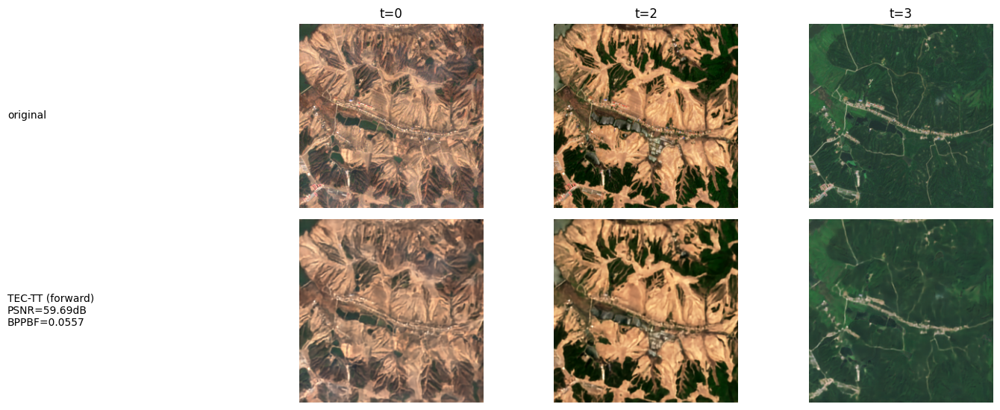

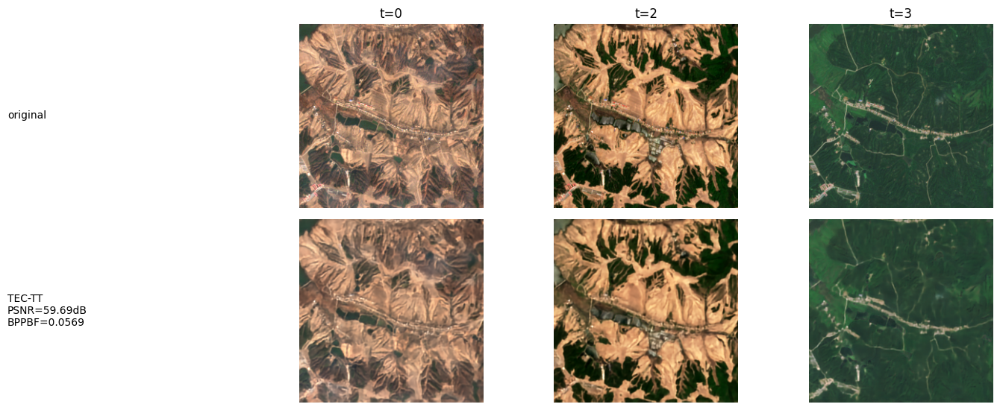

In [7]:
frame_indices = [0, T//2, T-1] if T >= 4 else list(range(T))
raw_orig = denormalize(seq_norm_btchw)

# Forward pass results
forward_raw_tt = denormalize(forward_recon_tt_norm)
metrics_forward_tt = compute_all_metrics(forward_raw_tt, raw_orig, mode='65k')
seq_psnr_forward_tt = metrics_forward_tt['psnr'].item()
seq_bppbf_forward_tt, per_frame_bppbf_forward_tt = compute_bppbf(forward_recon_tt_bits, H, W, C)
plot_grid(seq_norm_btchw, [forward_recon_tt_norm], ['TEC-TT (forward)'], frame_indices, [seq_psnr_forward_tt], [seq_bppbf_forward_tt])

# Range coding results
raw_tt = denormalize(recon_tt_norm)
metrics_tt = compute_all_metrics(raw_tt, raw_orig, mode='65k')
seq_psnr_tt = metrics_tt['psnr'].item()
seq_bppbf_tt, per_frame_bppbf_tt = compute_bppbf(bits_tt, H, W, C)
plot_grid(seq_norm_btchw, [recon_tt_norm], ['TEC-TT'], frame_indices, [seq_psnr_tt], [seq_bppbf_tt])

#### 8. FlexTEC forward pass + compress() / decompress() for k in [1,2,8]

In [8]:
qualities = [1,2,8]

# Forward pass results for FlexTEC
flex_forward_recon_list = []
flex_forward_bits_list = []
for k in qualities:
    forward_flex = flex(seq_norm_btchw, quality=k)
    forward_recon_flex_norm, forward_recon_flex_bits = forward_flex
    assert forward_recon_flex_norm.shape == seq_norm_btchw.shape
    
    flex_forward_recon_list.append(forward_recon_flex_norm)
    flex_forward_bits_list.append(forward_recon_flex_bits)
print('FlexTEC forward() bits/frame for k:', {k: b for k,b in zip(qualities, flex_forward_bits_list)})


# Range coding results for FlexTEC
flex_recons_norm = []
flex_bits_list = []
for k in qualities:
    payload = flex.compress(seq_norm_btchw, quality=k)
    r = flex.decompress(payload)
    flex_recons_norm.append(r)
    flex_bits_list.append(payload['bits'])
print('FlexTEC bits/frame for k:', {k: b for k,b in zip(qualities, flex_bits_list)})

FlexTEC forward() bits/frame for k: {1: [20058, 18831, 19875, 19820], 2: [35997, 32167, 35819, 35356], 8: [105550, 90026, 104690, 102395]}
FlexTEC bits/frame for k: {1: [23232, 23520, 23232, 27488], 2: [39328, 37152, 40192, 44448], 8: [109408, 94464, 110656, 107520]}


#### 9. FlexTEC Metrics + Multi-Quality Grid

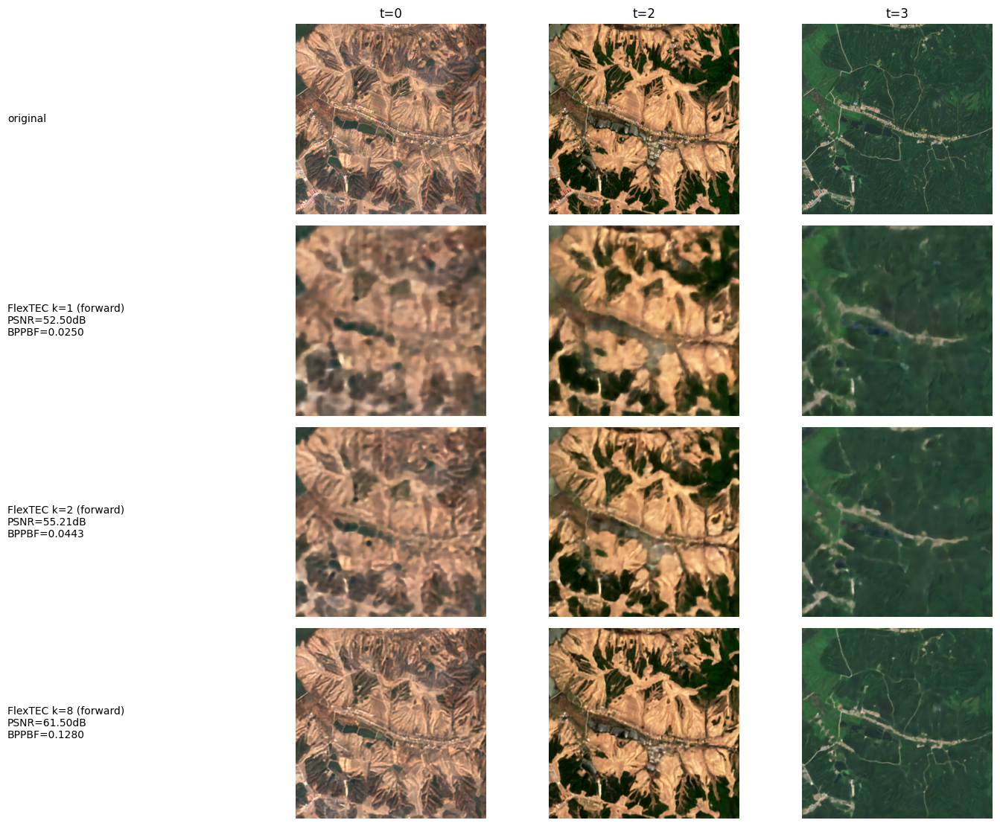

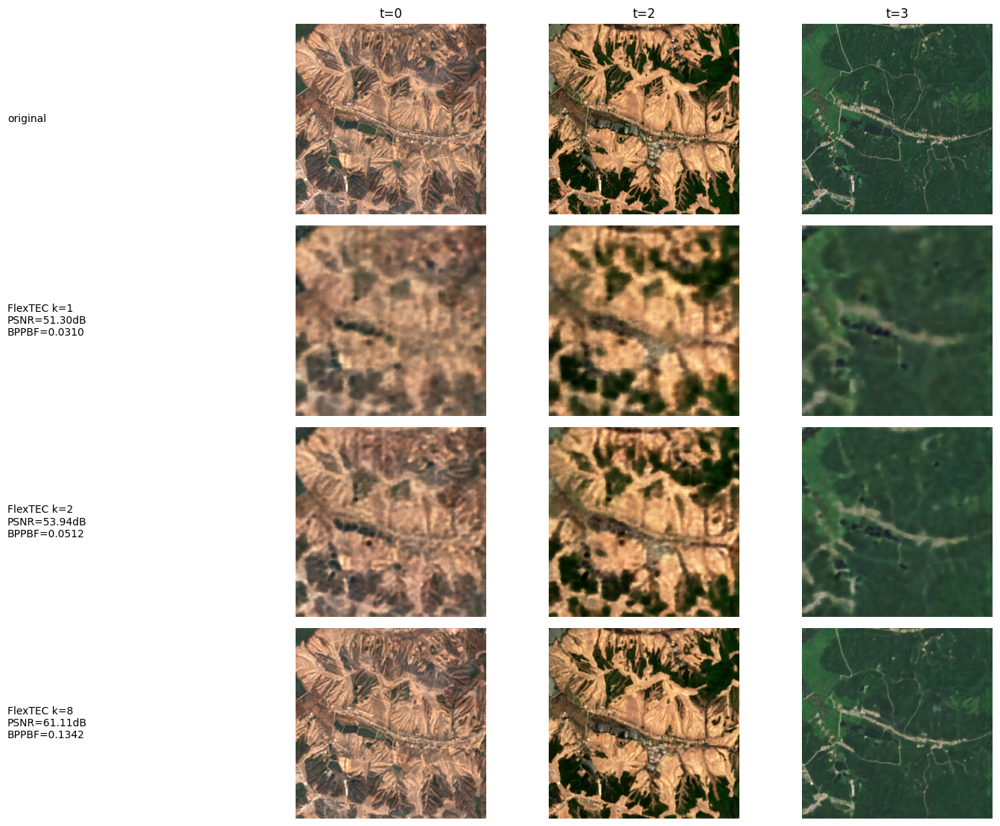

In [9]:
# FlexTEC forward pass metrics and plot
flex_forward_avg_psnr = []
flex_forward_avg_bppbf = []
for bits, recon in zip(flex_forward_bits_list, flex_forward_recon_list):
    raw_recon = denormalize(recon)
    metrics = compute_all_metrics(raw_recon, raw_orig, mode='65k')
    flex_forward_avg_psnr.append(metrics['psnr'].item())
    avg_bppbf, _ = compute_bppbf(bits, H, W, C)
    flex_forward_avg_bppbf.append(avg_bppbf)
plot_grid(seq_norm_btchw, flex_forward_recon_list, [f'FlexTEC k={k} (forward)' for k in qualities], frame_indices, flex_forward_avg_psnr, flex_forward_avg_bppbf)


# FlexTEC range coding metrics and plot
flex_avg_psnr = []
flex_avg_bppbf = []
for bits, recon in zip(flex_bits_list, flex_recons_norm):
    raw_recon = denormalize(recon)
    metrics = compute_all_metrics(raw_recon, raw_orig, mode='65k')
    flex_avg_psnr.append(metrics['psnr'].item())
    avg_bppbf, _ = compute_bppbf(bits, H, W, C)
    flex_avg_bppbf.append(avg_bppbf)

# Plot FlexTEC range coding results
plot_grid(seq_norm_btchw, flex_recons_norm, [f'FlexTEC k={k}' for k in qualities], frame_indices, flex_avg_psnr, flex_avg_bppbf)

#### 10. Parity: TEC-TT run() vs compress()/decompress()

##### Why Keep Both APIs?

The `run()` method offers a fast path for research workflows: it executes the model and returns reconstructions plus bit counts without performing a full entropy decode. This is ideal for rapid RD sweeps or ablation studies. The `compress` / `decompress` pair performs a codec-faithful roundtrip with actual bitstream construction and arithmetic decoding. Retaining both:

- Enables quick iteration (`run`) while preserving production realism (`compress`/`decompress`).
- Guarantees parity checks for reproducibility: when both give identical bits and reconstructions, the fast path is validated.
- Separates concerns: modeling vs. storage/transport

In [10]:
recon_run_tt, bits_run_tt = tt.run(seq_norm_btchw)
assert bits_run_tt == bits_tt, 'TEC-TT bits mismatch run vs compress'
raw_run_tt = denormalize(recon_run_tt)
metrics_run_tt = compute_all_metrics(raw_run_tt, raw_orig, mode='65k')
psnr_run_tt = metrics_run_tt['psnr'].item()
psnr_codec_tt = metrics_tt['psnr'].item()
print(f'TEC-TT parity: PSNR run={psnr_run_tt:.4f}, codec={psnr_codec_tt:.4f}, diff={abs(psnr_run_tt-psnr_codec_tt):.2e}')

TEC-TT parity: PSNR run=59.6869, codec=59.6869, diff=0.00e+00


In [11]:
# Check mse between run and compress/decompress results
tec_tt_comparsion_metrics = compute_all_metrics(raw_tt, raw_run_tt, mode='65k')
assert np.isclose(tec_tt_comparsion_metrics['mse'].item(), 0.0)

#### 11. Parity: FlexTEC run_flextec() vs compress()/decompress()

In [12]:
ref_k = 2
# Find index for k=2
idx_k2 = qualities.index(ref_k)
ref_bits = flex_bits_list[idx_k2]
ref_recon_norm = flex_recons_norm[idx_k2]
recon_run_flex, bits_run_flex = flex.run_flextec(seq_norm_btchw, quality=ref_k)
assert bits_run_flex == ref_bits, 'FlexTEC bits mismatch run vs compress (k=2)'
raw_run_flex = denormalize(recon_run_flex)
raw_codec_flex = denormalize(ref_recon_norm)
metrics_run_flex = compute_all_metrics(raw_run_flex, raw_orig, mode='65k')
metrics_codec_flex = compute_all_metrics(raw_codec_flex, raw_orig, mode='65k')
psnr_run_flex = metrics_run_flex['psnr'].item()
psnr_codec_flex = metrics_codec_flex['psnr'].item()
print(f'FlexTEC parity k=2: PSNR run={psnr_run_flex:.4f}, codec={psnr_codec_flex:.4f}, diff={abs(psnr_run_flex-psnr_codec_flex):.2e}')

FlexTEC parity k=2: PSNR run=53.9408, codec=53.9408, diff=0.00e+00


In [13]:
# Check mse between run and compress/decompress results (FlexTEC)
flextec_comparsion_metrics = compute_all_metrics(raw_codec_flex, raw_run_flex, mode='65k')
assert np.isclose(flextec_comparsion_metrics['mse'].item(), 0.0)

#### 12. Bits per Frame Plots

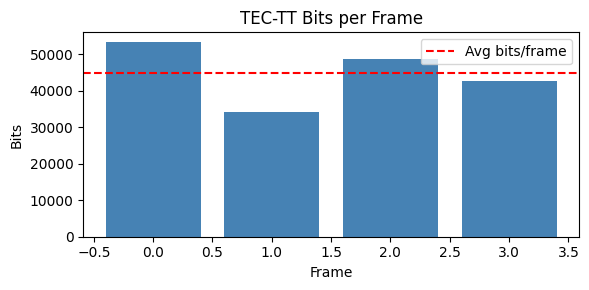

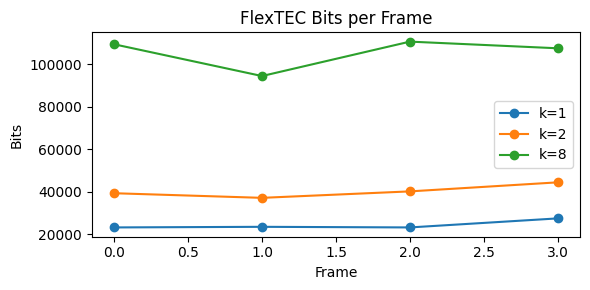

In [14]:
# TEC-TT bits bar
fig, ax = plt.subplots(1,1, figsize=(6,3))
ax.bar(range(T), bits_tt, color='steelblue')
ax.axhline(sum(bits_tt)/T, color='red', linestyle='--', label='Avg bits/frame')
ax.set_xlabel('Frame'); ax.set_ylabel('Bits'); ax.set_title('TEC-TT Bits per Frame'); ax.legend(); plt.tight_layout(); plt.show()

# FlexTEC bits lines
fig, ax = plt.subplots(1,1, figsize=(6,3))
for k,bits in zip(qualities, flex_bits_list):
    ax.plot(range(T), bits, marker='o', label=f'k={k}')
ax.set_xlabel('Frame'); ax.set_ylabel('Bits'); ax.set_title('FlexTEC Bits per Frame'); ax.legend(); plt.tight_layout(); plt.show()

#### 13. FlexTEC LatentRepacking-Only Version (Ablation - Trained without Masked Training). 
Forward pass only, for quick comparison.

In [15]:
flextec_lronly = FULL_MODEL_REGISTRY.build('flextec_v1_s2l2a', pretrained=True, lr_only=True, device=device)  # type: ignore

INFO:httpx:HTTP Request: HEAD https://huggingface.co/embed2scale/TerraCodec-1.0-FlexTEC-S2L2A/resolve/main/FlexTEC_v1_S2L2A_lambda-800.pt "HTTP/1.1 302 Found"


Enabling variable-rate compression in FlexTEC model.


In [16]:
# Forward pass only for FlexTEC LR-only model
flex_lronly_recon_list = []
flex_lronly_forward_bits_list = []
for k in qualities:
    forward_flex_lronly = flextec_lronly(seq_norm_btchw, quality=k)
    forward_recon_flex_lronly_norm, forward_recon_flex_lronly_bits = forward_flex_lronly
    assert forward_recon_flex_lronly_norm.shape == seq_norm_btchw.shape
    
    flex_lronly_recon_list.append(forward_recon_flex_lronly_norm)
    flex_lronly_forward_bits_list.append(forward_recon_flex_lronly_bits)
print('FlexTEC LR-only forward() bits/frame for k:', {k: b for k,b in zip(qualities, flex_lronly_forward_bits_list)})


FlexTEC LR-only forward() bits/frame for k: {1: [20058, 18831, 19875, 19820], 2: [35997, 32167, 35819, 35356], 8: [105550, 90026, 104690, 102395]}


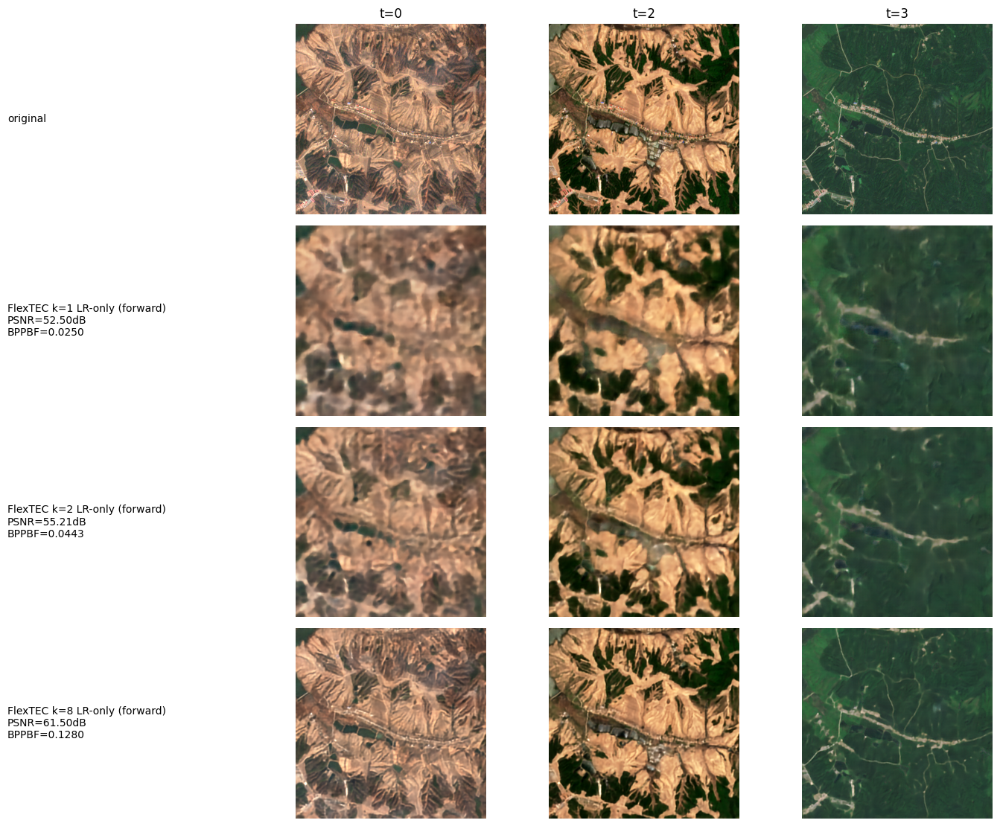

In [17]:
# Metrics and plot for FlexTEC LR-only forward pass
flex_lronly_avg_psnr = []
flex_lronly_avg_bppbf = []
for bits, recon in zip(flex_lronly_forward_bits_list, flex_lronly_recon_list):
    raw_recon = denormalize(recon)
    metrics = compute_all_metrics(raw_recon, raw_orig, mode='65k')
    flex_lronly_avg_psnr.append(metrics['psnr'].item())
    avg_bppbf, _ = compute_bppbf(bits, H, W, C)
    flex_lronly_avg_bppbf.append(avg_bppbf)
plot_grid(seq_norm_btchw, flex_lronly_recon_list, [f'FlexTEC k={k} LR-only (forward)' for k in qualities], frame_indices, flex_lronly_avg_psnr, flex_lronly_avg_bppbf)

In [18]:
print("Comparison with standard FlexTEC")
print('FlexTEC LR-only forward() bits/frame for k:', {k: b for k,b in zip(qualities, flex_lronly_forward_bits_list)})
print('\tFlexTEC bits/frame for k:', {k: b for k,b in zip(qualities, flex_bits_list)})
# psnr comparison
print('\tFlexTEC LR-only forward() PSNR for k:', {k: psnr for k,psnr in zip(qualities, flex_lronly_avg_psnr)})
print('\tFlexTEC PSNR for k:', {k: psnr for k,psnr in zip(qualities, flex_forward_avg_psnr)})

Comparison with standard FlexTEC
FlexTEC LR-only forward() bits/frame for k: {1: [20058, 18831, 19875, 19820], 2: [35997, 32167, 35819, 35356], 8: [105550, 90026, 104690, 102395]}
	FlexTEC bits/frame for k: {1: [23232, 23520, 23232, 27488], 2: [39328, 37152, 40192, 44448], 8: [109408, 94464, 110656, 107520]}
	FlexTEC LR-only forward() PSNR for k: {1: 52.503761291503906, 2: 55.213897705078125, 8: 61.500267028808594}
	FlexTEC PSNR for k: {1: 52.503761291503906, 2: 55.213897705078125, 8: 61.500267028808594}


#### 14. Comparing TEC-TT Checkpoints (Forward Pass used for speed)

In [19]:
# Compression comparison between models:
tt_dict = {}
for compression_level in [0.4, 1, 5, 20, 100, 200, 700]:
    tt_dict[compression_level] = FULL_MODEL_REGISTRY.build('terracodec_v1_tt_s2l2a', pretrained=True, compression=compression_level, device=device)  # type: ignore

INFO:httpx:HTTP Request: HEAD https://huggingface.co/embed2scale/TerraCodec-1.0-TT-S2L2A/resolve/main/TerraCodec_v1_TT_S2L2A_lambda-0.4.pt "HTTP/1.1 302 Found"
INFO:httpx:HTTP Request: HEAD https://huggingface.co/embed2scale/TerraCodec-1.0-TT-S2L2A/resolve/main/TerraCodec_v1_TT_S2L2A_lambda-1.pt "HTTP/1.1 302 Found"
INFO:httpx:HTTP Request: HEAD https://huggingface.co/embed2scale/TerraCodec-1.0-TT-S2L2A/resolve/main/TerraCodec_v1_TT_S2L2A_lambda-5.pt "HTTP/1.1 302 Found"
INFO:httpx:HTTP Request: HEAD https://huggingface.co/embed2scale/TerraCodec-1.0-TT-S2L2A/resolve/main/TerraCodec_v1_TT_S2L2A_lambda-20.pt "HTTP/1.1 302 Found"
INFO:httpx:HTTP Request: HEAD https://huggingface.co/embed2scale/TerraCodec-1.0-TT-S2L2A/resolve/main/TerraCodec_v1_TT_S2L2A_lambda-100.pt "HTTP/1.1 302 Found"
INFO:httpx:HTTP Request: HEAD https://huggingface.co/embed2scale/TerraCodec-1.0-TT-S2L2A/resolve/main/TerraCodec_v1_TT_S2L2A_lambda-200.pt "HTTP/1.1 302 Found"
INFO:httpx:HTTP Request: HEAD https://hugging

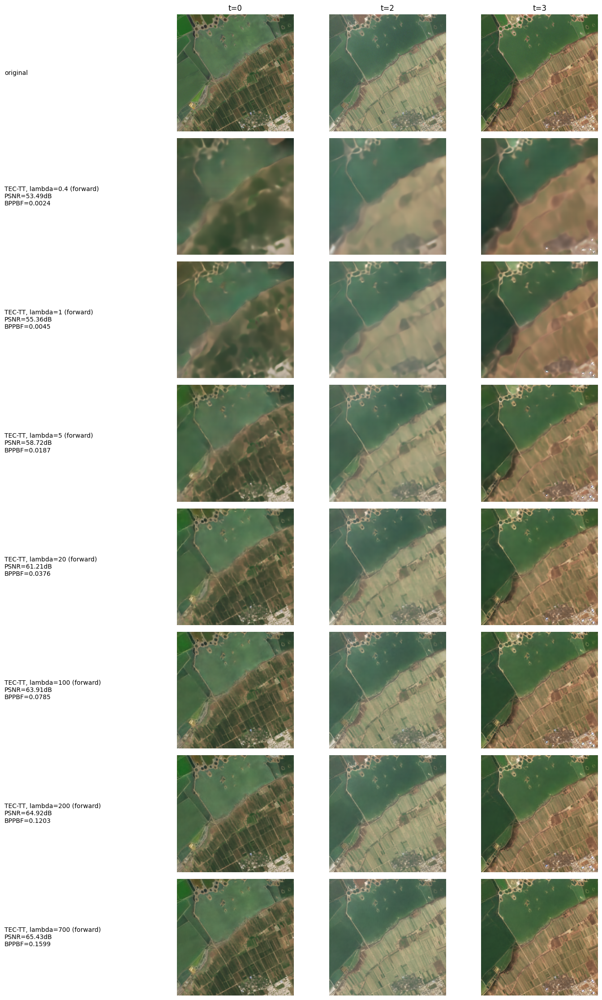

In [20]:
# Choose another sample
seq_btchw = data[1:2]  # [1,T,C,H,W]
seq_norm_btchw = normalize(seq_btchw)
B,T,C,H,W = seq_norm_btchw.shape

bits_list = []
recons_norm_list = []
for compression_level, model in tt_dict.items():
    forward_result = model(seq_norm_btchw)
    forward_recon_norm, forward_bits = forward_result
    bits_list.append(forward_bits)
    recons_norm_list.append(forward_recon_norm)

# Compute metrics and plot
avg_psnr_list = []
avg_bppbf_list = []
raw_orig = denormalize(seq_norm_btchw)
for bits, recon in zip(bits_list, recons_norm_list):
    raw_recon = denormalize(recon)
    metrics = compute_all_metrics(raw_recon, raw_orig, mode='65k')
    avg_psnr_list.append(metrics['psnr'].item())
    avg_bppbf, _ = compute_bppbf(bits, H, W, C)
    avg_bppbf_list.append(avg_bppbf)

# Plot comparison
plot_grid(seq_norm_btchw, recons_norm_list, [f'TEC-TT, lambda={cl} (forward)' for cl in tt_dict.keys()], frame_indices, avg_psnr_list, avg_bppbf_list)

#### 15. L1C TEC-TT Models

We further provide S2 L1C TEC-TT models for experimentation.

In [21]:
# Compression comparison between models:
tt_dict_l1c = {}
for compression_level in [5, 20, 100]:
    tt_dict_l1c[compression_level] = FULL_MODEL_REGISTRY.build('terracodec_v1_tt_s2l1c', pretrained=True, compression=compression_level, device=device)  # type: ignore

INFO:httpx:HTTP Request: HEAD https://huggingface.co/embed2scale/TerraCodec-1.0-TT-S2L1C/resolve/main/TerraCodec_v1_TT_S2L1C_lambda-5.pt "HTTP/1.1 302 Found"
INFO:httpx:HTTP Request: HEAD https://huggingface.co/embed2scale/TerraCodec-1.0-TT-S2L1C/resolve/main/TerraCodec_v1_TT_S2L1C_lambda-20.pt "HTTP/1.1 302 Found"
INFO:httpx:HTTP Request: HEAD https://huggingface.co/embed2scale/TerraCodec-1.0-TT-S2L1C/resolve/main/TerraCodec_v1_TT_S2L1C_lambda-100.pt "HTTP/1.1 302 Found"
